In [1]:
# The yolov8 model is trained using Google Colab, so just the necessary files are exported to this project

In [2]:
# import necessary libraries
from IPython.display import Image, display
import os
from IPython import display
display.clear_output()

In [5]:
# install the roboflow dataset, this dataset is created by me using the chinese dataset previously exported in this project
# it has 180 images per digit, 90 of them in their original sizes and 90 of them in random sizes in order to be able
# to detect all sizes of digits
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="CtApa0G4J3YNfbq3UAhI")
project = rf.workspace("object-detection-uscpv").project("chinese-digits")
dataset = project.version(17).download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics<=8.0.20 is required but found version=8.0.41, to fix: `pip install ultralytics<=8.0.20`

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Extracting Dataset Version Zip to Chinese-Digits-17 in yolov8:: 100%|█| 5412/541


In [20]:
# This stage is compiled using Google Colab since it gives a GPU usage service, so some unnecessary files not exported.
# the yolov8 model is trained with the installed dataset in the previous stage
# the model works through the whole dataset 25 times
# image sizes are extended to 640x640 by default by roboflow
!yolo task=detect mode=train model=yolov8s.pt data=../../yolov8_datasets/chinese_dataset/Chinese-Digits-17/data.yaml epochs=25 imgsz=640

Ultralytics YOLOv8.0.41 🚀 Python-3.9.13 torch-1.13.1 CPU
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=../../yolov8_datasets/chinese_dataset/Chinese-Digits-17/data.yaml, epochs=25, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, min_memory=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, split=val, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optim

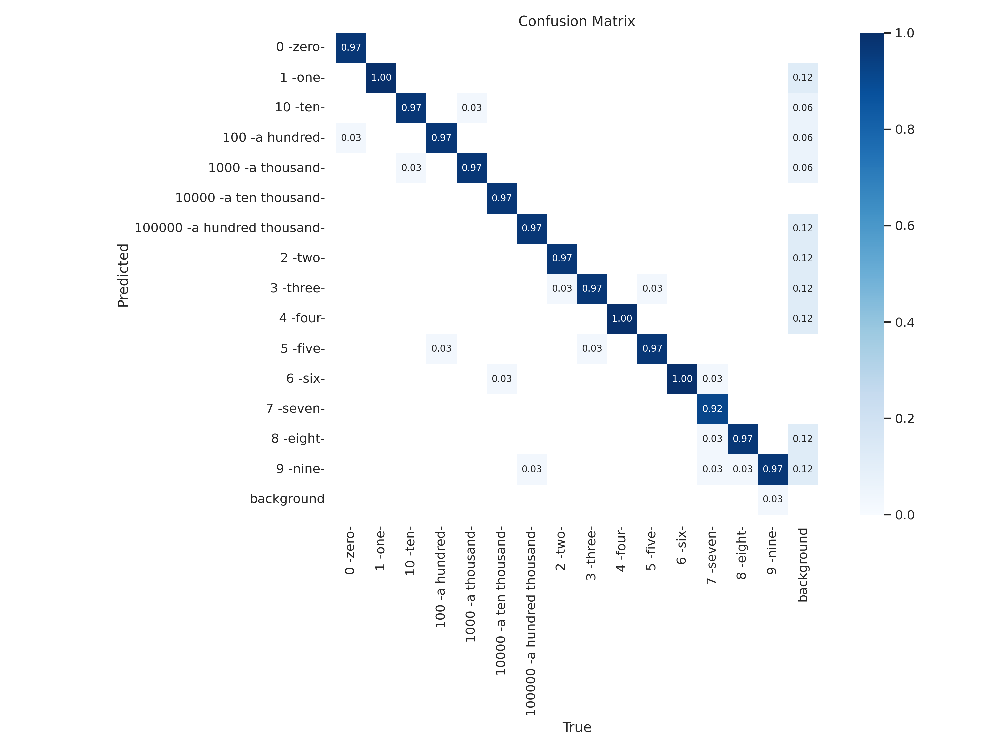

In [3]:
# shows the confusion matrix of the trained model
# for example for the class '0 -zero-', it detected the digit correctly with 0.97.
Image(filename='../../results/chinese/confusion_matrix.png')

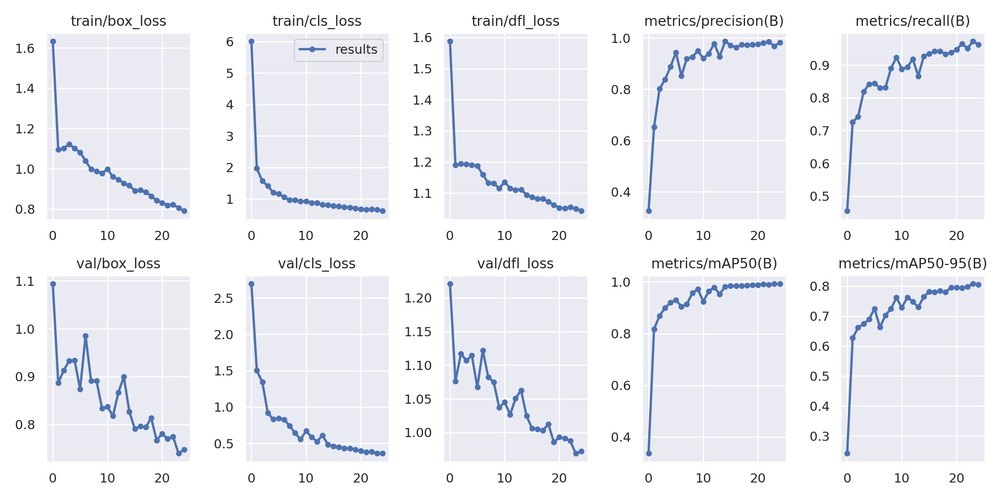

In [9]:
# shows the losses and metrics of the trained model
# losses are decreased in both training and validation data
# Precision measures how much of the bbox predictions are correct
# Recall measures how much of the true bbox were correctly predicted
# the last two tables are the mean Average Precision (mAP) at IoU (Intersection over Union) threshold of 0.5, and threshold between 0.5 and 0.95.
Image(filename = '../../results/chinese/results.png')

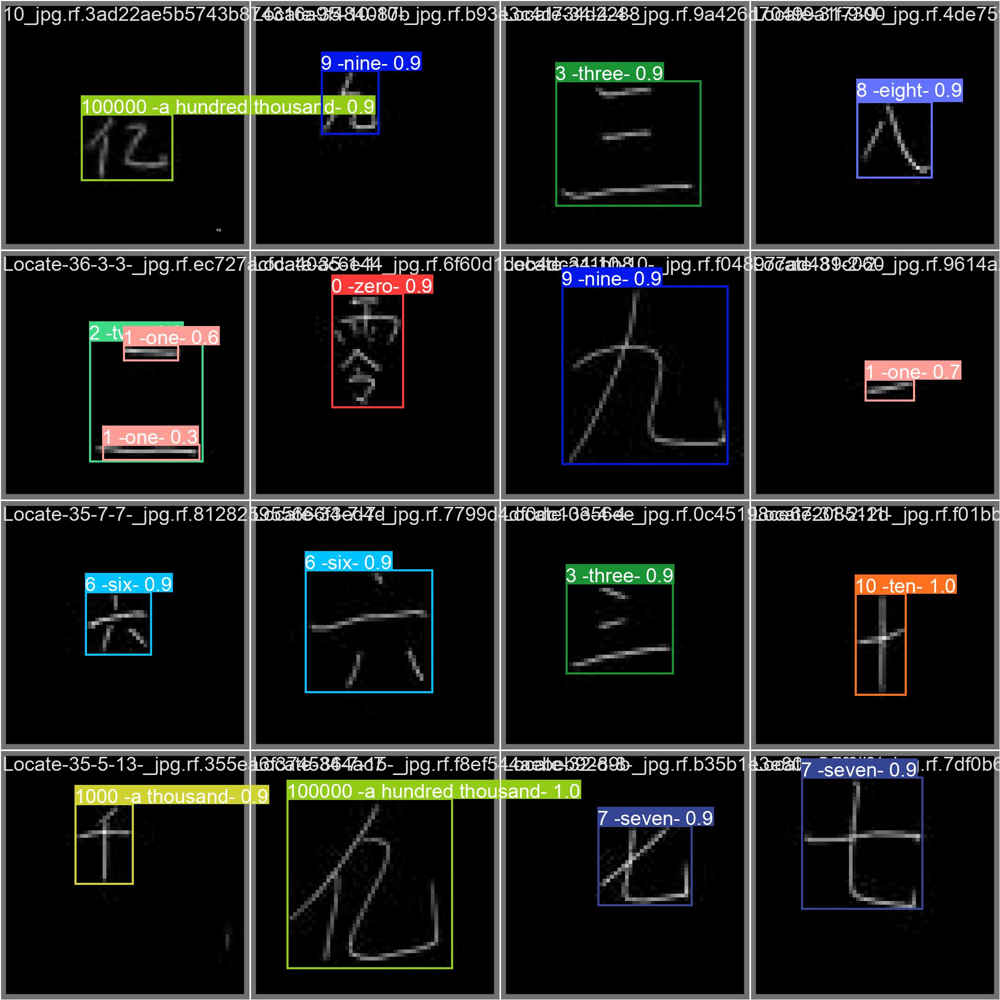

In [10]:
# The first batch, size of 16, images predictions
Image(filename='../../results/chinese/val_batch0_pred.jpg')

In [1]:
# tests the model on test images
!yolo task=detect mode=predict model=../../yolov8_weights/chinese/best.pt conf=0.25 source=../../yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images save=True

Ultralytics YOLOv8.0.41 🚀 Python-3.9.13 torch-1.13.1 CPU
[W NNPACK.cpp:53] Could not initialize NNPACK! Reason: Unsupported hardware.
Model summary (fused): 168 layers, 11131389 parameters, 0 gradients, 28.5 GFLOPs

image 1/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/10_jpg.rf.af8c59081d7e5e838405f6b2952f585d.jpg: 640x640 1 10 -ten-, 516.0ms
image 2/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/10_jpg.rf.df0e08535eaec988147e41ebc8b48bb9.jpg: 640x640 1 7 -seven-, 530.1ms
image 3/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/11_jpg.rf.0d38abaaa35710feaf25f6e2e206a1f3.jpg: 640x640 1 0 -zero-, 446.6ms
image 4/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_writ

image 34/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/2_jpg.rf.7f05813dc49a1c498838e138854a2347.jpg: 640x640 1 5 -five-, 389.8ms
image 35/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/2_jpg.rf.89bcd62b7fcaa84818ca58de60fb5a3e.jpg: 640x640 1 10000 -a ten thousand-, 559.1ms
image 36/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/31_jpg.rf.4aa74ad0ff797d8fe595adceb0d86772.jpg: 640x640 1 6 -six-, 338.9ms
image 37/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/32_jpg.rf.15733e71add7aeded712ebd34563c2dc.jpg: 640x640 1 100 -a hundred-, 444.7ms
image 38/285 /Users/zeynepnuraksay

image 69/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/51_jpg.rf.8cd585559e01e41f1eb97b0ccd7c563a.jpg: 640x640 1 100000 -a hundred thousand-, 338.4ms
image 70/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/52_jpg.rf.7506589725414adb573b1bbefe013911.jpg: 640x640 1 9 -nine-, 340.1ms
image 71/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/53_jpg.rf.bbba0a2783c68cf025c8e193bd61384f.jpg: 640x640 1 6 -six-, 337.6ms
image 72/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/54_jpg.rf.8277992d18cef538076c07c0ed5ded09.jpg: 640x640 1 9 -nine-, 341.0ms
image 73/285 /Users/zeynepnuraksay

image 103/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/6_jpg.rf.692a868ab617e14c76eab680cf4b6098.jpg: 640x640 1 1000 -a thousand-, 348.3ms
image 104/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/6_jpg.rf.80d9f058acfd65da4d7b14252cfba4b3.jpg: 640x640 1 2 -two-, 389.8ms
image 105/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/6_jpg.rf.f2e8a2a7b921b9f89ed4c52ac115a636.jpg: 640x640 1 0 -zero-, 366.0ms
image 106/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/70_jpg.rf.8ca63b6e50447951a049aebea78eee9b.jpg: 640x640 1 8 -eight-, 343.8ms
image 107/285 /Users/zeynepnuraksay/Deskto

image 137/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/90_jpg.rf.f179783476f174ec0c06ff7e84f4c2ed.jpg: 640x640 1 1 -one-, 352.6ms
image 138/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/9_jpg.rf.3c12fbe3347bd13dbe8a7660b7ac4811.jpg: 640x640 1 1 -one-, 342.2ms
image 139/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/9_jpg.rf.b3fd80a4fcf8207a103e99984ebfaf98.jpg: 640x640 1 3 -three-, 357.0ms
image 140/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/9_jpg.rf.e0a60709e4006a6fe8a5ad00f64637bd.jpg: 640x640 1 10000 -a ten thousand-, 349.0ms
image 141/285 /Users/zeynepnuraksay/De

image 170/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/Locate-28-2-11-_jpg.rf.4f8f6eaaa5fced8e63319800283065ea.jpg: 640x640 1 10 -ten-, 355.4ms
image 171/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/Locate-28-3-12-_jpg.rf.c5b93f2a44360952711c87b72c60350d.jpg: 640x640 1 100 -a hundred-, 362.9ms
image 172/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/Locate-29-1-1-_jpg.rf.10a042ee1deca41f6ffac8c4124b6b37.jpg: 640x640 1 0 -zero-, 354.5ms
image 173/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/Locate-29-2-2-_jpg.rf.b2d7b416798983ab27460a0bcd7b7de2.jpg: 640x640 1 1 -one-, 

image 203/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/Locate-45-7-15-_jpg.rf.32190a11932088dc294162ae28624413.jpg: 640x640 1 100000 -a hundred thousand-, 354.3ms
image 204/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/Locate-45-8-8-_jpg.rf.024c55976a12c2817ea6e94fb3be3f84.jpg: 640x640 1 7 -seven-, 359.2ms
image 205/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/Locate-46-1-1-_jpg.rf.26f32e59e05bfc7a92af34998fa2f6b3.jpg: 640x640 1 0 -zero-, 364.1ms
image 206/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/Locate-46-5-5-_jpg.rf.e124f92d17e04c256e6c1aa490183960.jpg: 640x640

image 236/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/Locate-62-1-1-_jpg.rf.659e478456d707e736cb6ebb5ac89590.jpg: 640x640 1 0 -zero-, 382.0ms
image 237/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/Locate-62-10-10-_jpg.rf.0c3ec60e6fa3f6e6dce757483ad6d8e1.jpg: 640x640 1 9 -nine-, 361.1ms
image 238/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/Locate-62-2-11-_jpg.rf.abbe4893fcbcccd764b3d9908f017b78.jpg: 640x640 1 10 -ten-, 363.2ms
image 239/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/Locate-62-3-12-_jpg.rf.d59ad524f52f60fa66fc452a0649ff91.jpg: 640x640 1 100 -a hundred

image 269/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/Locate-84-10-10-_jpg.rf.221e7e20726a8a6105414c9aa0ca741d.jpg: 640x640 1 9 -nine-, 371.9ms
image 270/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/Locate-84-6-14-_jpg.rf.2248bb50c90022fb25c8c3579f61c216.jpg: 640x640 1 10000 -a ten thousand-, 359.5ms
image 271/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/Locate-85-2-11-_jpg.rf.4eb7cab79a73bf2a01f6718c3aef8f0e.jpg: 640x640 1 10 -ten-, 366.9ms
image 272/285 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/yolov8_datasets/chinese_dataset/Chinese-Digits-17/test/images/Locate-85-5-5-_jpg.rf.64d05779626c5d576998a030740f9392.jpg: 640x640 1 

/var/folders/yt/2hzk91fs5h750f2m0xbf7hfm0000gn/T/ipykernel_66266/1503753589.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


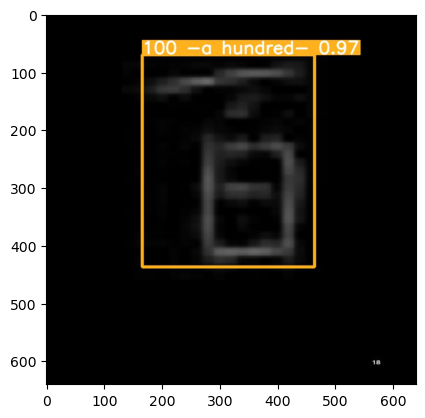

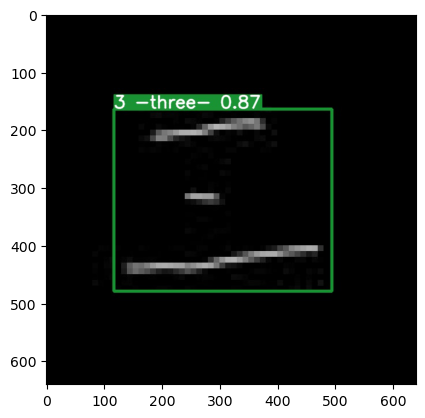

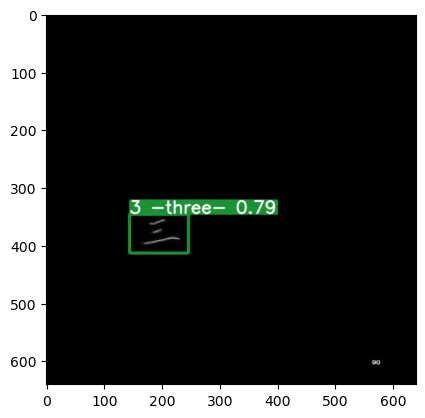

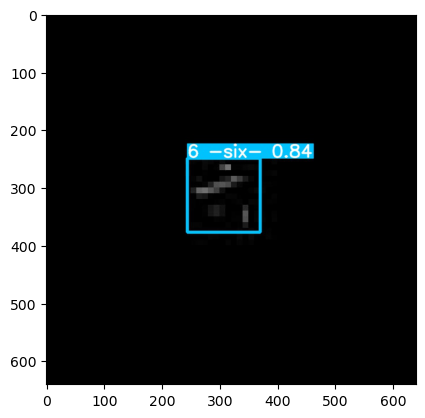

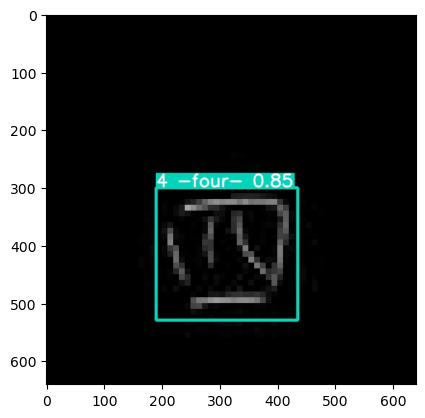

...

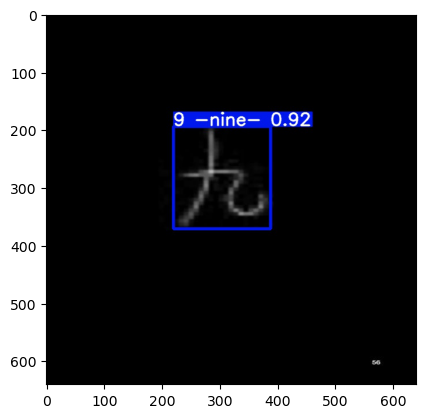

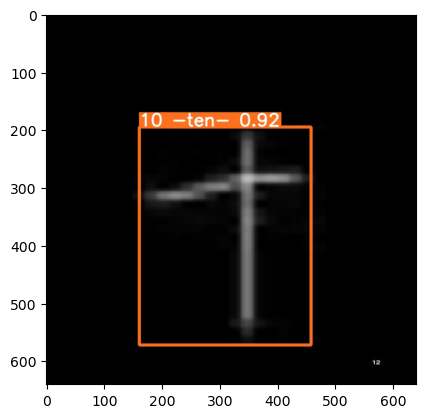

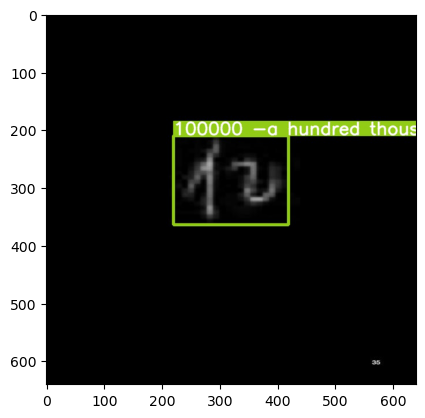

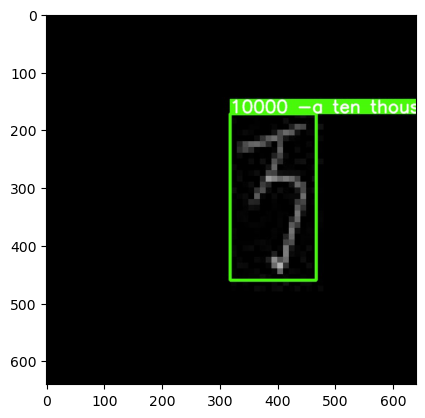

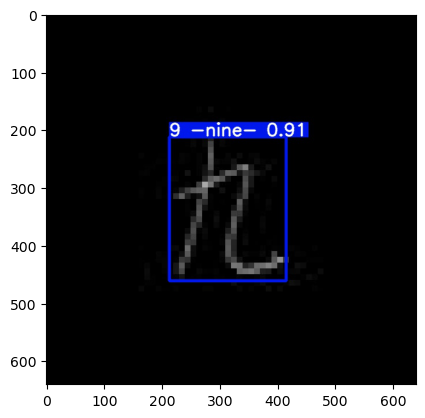

In [2]:
# shows the result of the test images
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def process(filename):
    image = mpimg.imread(filename)
    plt.figure()
    plt.imshow(image)

for filename in os.listdir('runs/detect/predict4'):
  process('runs/detect/predict4/' + filename)

True

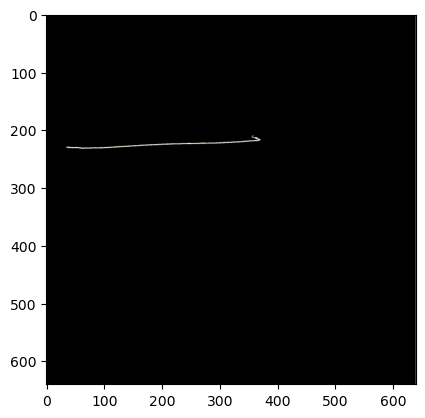

In [12]:
# converts image to black background and white digit
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('image.jpeg')
ret, img = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)

img = cv2.resize(img, (640, 640), interpolation = cv2.INTER_AREA)

plt.imshow(img)
cv2.imwrite('image.jpeg', img)

In [15]:
# performs model on the image
!yolo task=detect mode=predict model=../../yolov8_weights/chinese/best.pt conf=0.25 source='image.jpeg' save=True

Ultralytics YOLOv8.0.41 🚀 Python-3.9.13 torch-1.13.1 CPU
[W NNPACK.cpp:53] Could not initialize NNPACK! Reason: Unsupported hardware.
Model summary (fused): 168 layers, 11131389 parameters, 0 gradients, 28.5 GFLOPs

image 1/1 /Users/zeynepnuraksay/Desktop/final_year_project/zna2/hand_written_digits_recognition/ipynb_files/chinese/image.jpeg: 640x640 1 1 -one-, 483.4ms
Speed: 4.7ms preprocess, 483.4ms inference, 14.6ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict


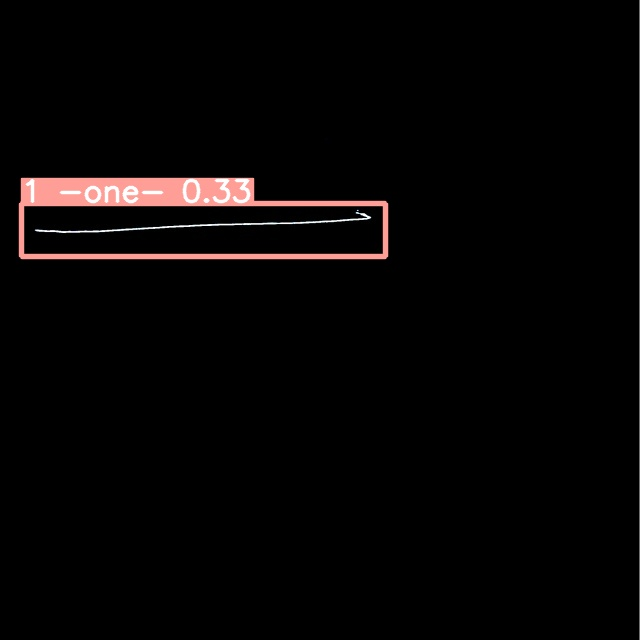

In [16]:
# shows the predictions
from IPython.display import Image, display
Image(filename='runs/detect/predict/image.jpeg')